In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
from datetime import date


In [2]:
people = pd.read_csv("core/People.csv")


In [3]:
batting = pd.read_csv("core/Batting.csv")


In [4]:
collegeplaying = pd.read_csv("core\CollegePlaying.csv")


In [5]:
teams = pd.read_csv("upstream\Teams.csv")


In [6]:
pitching = pd.read_csv("core\PitchingPost.csv")


In [7]:
# Merge people and batting tables on playerID


In [8]:
p_people = people[["playerID", "weight", "height", "bats",
                   "throws", "debut", "finalGame", "retroID", "bbrefID", "nameFirst", "nameLast", "birthYear", "birthMonth", "birthDay"]]

p_b = p_people.merge(batting, on="playerID")
print(p_b.head(5))


    playerID  weight  height bats throws       debut   finalGame   retroID  \
0  aardsda01   215.0    75.0    R      R  2004-04-06  2015-08-23  aardd001   
1  aardsda01   215.0    75.0    R      R  2004-04-06  2015-08-23  aardd001   
2  aardsda01   215.0    75.0    R      R  2004-04-06  2015-08-23  aardd001   
3  aardsda01   215.0    75.0    R      R  2004-04-06  2015-08-23  aardd001   
4  aardsda01   215.0    75.0    R      R  2004-04-06  2015-08-23  aardd001   

     bbrefID nameFirst  ...  RBI   SB   CS  BB   SO  IBB  HBP   SH   SF  GIDP  
0  aardsda01     David  ...  0.0  0.0  0.0   0  0.0  0.0  0.0  0.0  0.0   0.0  
1  aardsda01     David  ...  0.0  0.0  0.0   0  0.0  0.0  0.0  1.0  0.0   0.0  
2  aardsda01     David  ...  0.0  0.0  0.0   0  0.0  0.0  0.0  0.0  0.0   0.0  
3  aardsda01     David  ...  0.0  0.0  0.0   0  1.0  0.0  0.0  0.0  0.0   0.0  
4  aardsda01     David  ...  0.0  0.0  0.0   0  0.0  0.0  0.0  0.0  0.0   0.0  

[5 rows x 35 columns]


In [14]:
# filteroutdates

start_date = "2019-01-01"
end_date = "2020-08-18"
after_start_date = p_b["finalGame"] >= start_date
before_end_date = p_b["finalGame"] <= end_date
between_two_dates = after_start_date & before_end_date
p_bfinal = p_b.loc[between_two_dates]


In [17]:
# filterplayers with less than 50 games

activeplayers = p_bfinal[p_bfinal["G"] > 49]

activeplayers["fullname"] = activeplayers["nameFirst"] .str.cat(
    activeplayers["nameLast"], sep=" ")

columns = ["nameFirst", "nameLast"]
activeplayers.drop(columns, axis=1, inplace=True)


In [18]:
# Which active player had the most runs batted in (“RBI” from the Batting table) from 2015-2018?

activeplayers.sort_values(by=['RBI'], inplace=True, ascending=False)
years = [2015, 2016, 2017, 2018]
RBIyears = activeplayers[activeplayers.yearID.isin(years)]
aggregation_functions = {'RBI': 'sum', 'fullname': 'first'}

RBInew = RBIyears.groupby(
    RBIyears['fullname']).aggregate(aggregation_functions)

RBInew.sort_values(by='RBI', inplace=True, ascending=False)
print(RBInew.head())


                     RBI           fullname
fullname                                   
Nolan Arenado      503.0      Nolan Arenado
Edwin Encarnacion  452.0  Edwin Encarnacion
Anthony Rizzo      420.0      Anthony Rizzo
Nelson Cruz        414.0        Nelson Cruz
Paul Goldschmidt   408.0   Paul Goldschmidt


In [19]:
# How many double plays did Albert Pujols ground into (“GIDP” from Batting table) in 2016?

GIDPyear = activeplayers[activeplayers["yearID"] == 2016]
GIDPplayer = GIDPyear[GIDPyear["fullname"] == "Albert Pujols"]


In [20]:
print(GIDPplayer[["fullname", "GIDP"]])


            fullname  GIDP
78219  Albert Pujols  24.0


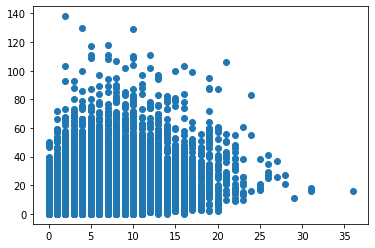

In [21]:
# SCATTERPLOT scatter plot relating triples (3B) and steals (SB)

plt.scatter(batting['3B'], batting["SB"])
plt.show()



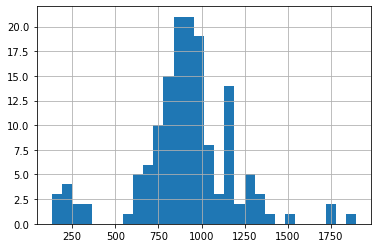

In [22]:
# HISTOGRAM A histogram of triples (3B) per year.

batting_triplets = batting.groupby("yearID")["3B"].sum()
batting_triplets.hist(bins=30)



texas        265
usc          250
stanford     248
arizonast    236
michigan     191
Name: schoolID, dtype: int64


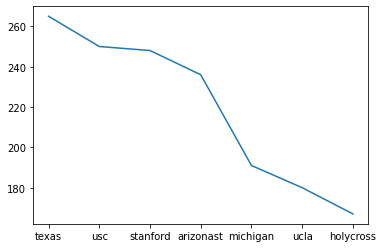

In [23]:
# Which college produced more players?

moreplayers = collegeplaying["schoolID"].value_counts()
print(moreplayers.head())
moreplayers.iloc[0:7].plot()


In [24]:
# Which team has won the World Series with most attendance in the same year?

teams_1 = teams[['name', 'attendance', 'yearID', 'WSWin']]
wsteams = teams_1[teams_1.WSWin != "N"]


In [25]:
wsteams.sort_values(by='attendance', ascending=False)


,name,attendance,yearID,WSWin
2152,Toronto Blue Jays,4057947.0,1993,Y
2124,Toronto Blue Jays,4028318.0,1992,Y
2612,New York Yankees,3719358.0,2009,Y
2585,Philadelphia Phillies,3422583.0,2008,Y
2530,St. Louis Cardinals,3407104.0,2006,Y
...,...,...,...,...
622,Chicago Whales,NaN,1915,NaN
627,Kansas City Packers,NaN,1915,NaN
628,Newark Pepper,NaN,1915,NaN
634,Pittsburgh Rebels,NaN,1915,NaN


In [26]:
# Which player won the most games with wild pitchs during post season?

pitching['playerID'] = pitching['playerID'].str[:-2]

pitching.drop(pitching.columns.difference(
    ['playerID', 'W', 'L', 'WP']), 1, inplace=True)

pitching.sort_values(by="WP", ascending=False)

aggregation_functions = {'W': 'sum',
                         'WP': 'sum', 'L': 'sum', 'playerID': 'first'}

df_new = pitching.groupby(
    pitching['playerID']).aggregate(aggregation_functions)

df_new.sort_values(by='WP', ascending=False)


,W,WP,L,playerID
playerID,,,,
clemero,12,10.0,8,clemero
lackejo,8,10.0,6,lackejo
kershcl,9,10.0,11,kershcl
ankieri,0,9.0,0,ankieri
verlaju,14,8.0,11,verlaju
...,...,...,...,...
hudsona,1,0.0,0,hudsona
hudsoda,1,0.0,2,hudsoda
hudsoch,1,0.0,2,hudsoch
